In [1]:
import numpy as np 
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Input,Dense
from tensorflow.keras.models import Model
import gym

In [2]:
a = np.array([0,1,2])
b = np.zeros((a.size, a.max()+1))
b[np.arange(a.size),a] = 1


In [3]:
from tensorflow.keras import layers

In [4]:
import pettingzoo
from pettingzoo.mpe import simple_spread_v1

In [5]:
env =simple_spread_v1.parallel_env(max_frames=100)


C:\ProgramData\Miniconda3\envs\tensorflow\lib\site-packages\gym\logger.py:30: UserWarning: WARN: Box bound precision lowered by casting to float32
  warnings.warn(colorize('%s: %s'%('WARN', msg % args), 'yellow'))


In [6]:
num_states = env.observation_spaces['agent_0'].shape[0]
print("Size of State Space ->  {}".format(num_states))
num_actions = env.action_spaces['agent_0'].shape[0]
print("Size of Action Space ->  {}".format(num_actions))

upper_bound = env.action_spaces['agent_0'].high[0]
lower_bound = env.action_spaces['agent_0'].low[0]

print("Max Value of Action ->  {}".format(upper_bound))
print("Min Value of Action ->  {}".format(lower_bound))

Size of State Space ->  18
Size of Action Space ->  2
Max Value of Action ->  1.0
Min Value of Action ->  -1.0


In [7]:
num_states=21

In [16]:
class OUActionNoise:
    def __init__(self, mean, std_deviation, theta=0.15, dt=1e-2, x_initial=None):
        self.theta = theta
        self.mean = mean
        self.std_dev = std_deviation
        self.dt = dt
        self.x_initial = x_initial
        self.reset()

    def __call__(self):
        # Formula taken from https://www.wikipedia.org/wiki/Ornstein-Uhlenbeck_process.
        x = (
            self.x_prev
            + self.theta * (self.mean - self.x_prev) * self.dt
            + self.std_dev * np.sqrt(self.dt) * np.random.normal(size=self.mean.shape)
        )
        # Store x into x_prev
        # Makes next noise dependent on current one
        self.x_prev = x
        return x

    def reset(self):
        if self.x_initial is not None:
            self.x_prev = self.x_initial
        else:
            self.x_prev = np.zeros_like(self.mean)

In [17]:
std_dev = 0.10
ou_noise = OUActionNoise(mean=np.zeros(num_actions), std_deviation=float(std_dev) * np.ones(num_actions))

In [9]:
class Agent:
    def __init__(self, buffer_capacity=5, batch_size=3):
        self.buffer_capacity = buffer_capacity
        self.batch_size = batch_size

        self.buffer_counter = 0
        self.last_states={'agent_0':0,'agent_1':0,'agent_2':0}
        
        self.next_states={'agent_0':0,'agent_1':0,'agent_2':0}
        
        self.state_buffer = np.zeros((self.buffer_capacity, 21))
        self.action_buffer = np.zeros((self.buffer_capacity, 2))
        self.next_state_buffer=np.zeros((self.buffer_capacity,21))
        self.reward_buffer=np.zeros((self.buffer_capacity,1))
        
        self.actor=get_actor()
        self.target_actor=get_actor()
        
        self.critic=get_critic()
        self.target_critic = get_critic()
        
        self.target_critic.set_weights(self.critic.get_weights())
        self.target_actor.set_weights(self.actor.get_weights())
        
        self.critic_lr = 0.0003
        self.actor_lr = 0.0003
        self.gamma=0.99
        self.tau=0.50
        self.epsilon=1
        self.episode_steps=0
        self.sum_rewards = []
        self.upper_bound=1
        self.lower_bound=-1
        self.critic_optimizer = tf.keras.optimizers.Adam(self.critic_lr)
        self.actor_optimizer = tf.keras.optimizers.Adam(self.actor_lr)
    
    
    def record(self, obs_tuple):
        index = self.buffer_counter % self.buffer_capacity   
        for agent in env.agents:
            self.state_buffer[index]=obs_tuple[0][agent]
            self.action_buffer[index]=obs_tuple[1][agent]
            self.reward_buffer[index]=obs_tuple[2][agent]
            self.next_state_buffer[index]=obs_tuple[3][agent]
            self.buffer_counter += 1
            index = self.buffer_counter % self.buffer_capacity        
        
        

    def learn(self):

        record_range = min(self.buffer_counter, self.buffer_capacity)

        batch_indices = np.random.choice(record_range, self.batch_size)
        state_batches=tf.convert_to_tensor(self.state_buffer[batch_indices],dtype=tf.float32)
     
        action_batches=tf.convert_to_tensor(self.action_buffer[batch_indices],dtype=tf.float32)
        next_state_batches=tf.convert_to_tensor(self.next_state_buffer[batch_indices],dtype=tf.float32)
        
        reward_batches=tf.convert_to_tensor(self.reward_buffer[batch_indices],dtype=tf.float32)
        self.update(state_batches,action_batches,next_state_batches,reward_batches)
    
    
    def update(self,state_batch,action_batch,next_state_batch,reward_batch):
        with tf.GradientTape() as tape:
            target_actions = self.target_actor(next_state_batch, training=True)
          
            y = reward_batch + self.gamma * self.target_critic([next_state_batch, target_actions], training=True)
           
            critic_value = self.critic([state_batch, action_batch], training=True)
            critic_loss = tf.math.reduce_mean(tf.math.square(y - critic_value))

        critic_grad = tape.gradient(critic_loss, self.critic.trainable_variables)
        self.critic_optimizer.apply_gradients(
            zip(critic_grad, self.critic.trainable_variables)
        )

        with tf.GradientTape() as tape:
            actions = self.actor(state_batch, training=True)
            critic_value = self.critic([state_batch, actions], training=True)
            actor_loss = -tf.math.reduce_mean(critic_value)

        actor_grad = tape.gradient(actor_loss, self.actor.trainable_variables)
        self.actor_optimizer.apply_gradients(
            zip(actor_grad, self.actor.trainable_variables)
        )

                                    
                                    
    def policy(self,state,noise_object):
        state = tf.convert_to_tensor(state)
        
        sampled_actions = tf.squeeze(self.actor(state))
       
        noise = noise_object()
        sampled_actions = sampled_actions.numpy() + noise
        sampled_actions=np.clip(sampled_actions,self.lower_bound,self.upper_bound)
        return sampled_actions
    
    @tf.function
    def update_target(self,target_weights, weights):
        for (a, b) in zip(target_weights, weights):
            a.assign(b * self.tau + a * (1 - self.tau))
    

In [10]:
def get_critic():
    state_input=layers.Input(shape=(num_states))
    state_output=layers.Dense(16,activation='relu',autocast=False)(state_input)
    state_output=layers.Dense(32,activation='relu')(state_output)
    
    action_input=layers.Input(shape=(num_actions))
    action_output=layers.Dense(16,activation='relu')(action_input)
    action_output=layers.Dense(32,activation='relu')(action_output)

    concat=layers.Concatenate()([state_output,action_output])
    x=layers.Dense(256,activation='relu')(concat)
    
    x=layers.Dense(256,activation='relu')(x)
    x=layers.Dense(1,activation='linear')(x)
    model=tf.keras.Model([state_input,action_input],x)
    return model

In [11]:
def get_actor():
    last_init=tf.random_uniform_initializer(minval=-0.003,maxval=0.003)
    i=layers.Input(shape=(num_states))
    x=layers.Dense(128,activation='relu',autocast=False)(i)
    x=layers.Dense(256,activation='relu')(x)
    x=layers.Dense(256,activation='relu')(x)
    x=layers.Dense(num_actions,activation='tanh',kernel_initializer=last_init)(x)
    x=x*upper_bound
    model=tf.keras.Model(i,x)
    return model

In [14]:
actor=get_critic()

In [15]:
actor.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 21)]         0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 2)]          0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 16)           352         input_1[0][0]                    
__________________________________________________________________________________________________
dense_2 (Dense)                 (None, 16)           48          input_2[0][0]                    
______________________________________________________________________________________________

In [18]:
def change_1(states):

    for i,m in enumerate(states.keys()):
        states[m]=np.array([np.append(states[m],b[i])])
    return states
        
    

In [19]:
agent1=Agent(500000,128)

In [20]:
tf.keras.backend.set_floatx('float32')

In [21]:
ep_reward_list = []

episode_steps=[]

for episode in range(1000):
    states={'agent_0':0,'agent_1':0,'agent_2':0}
    agent1.last_states = env.reset()
    agent1.last_states=change_1(agent1.last_states)
    agent1.sum_rewards = {'agent_0':0,'agent_1':0,'agent_2':0}
    agent1.episode_steps=0
    while True:
        
      
        
        actions = {agent: agent1.policy(agent1.last_states[agent],ou_noise) for agent in env.agents}
    
        agent1.next_states,rewards,done,info=env.step(actions)
     
        
        agent1.next_states=change_1(agent1.next_states)
        
     
        
        agent1.sum_rewards={agent: (agent1.sum_rewards[agent]+rewards[agent]) for agent in rewards}
        agent1.episode_steps+=1
        
        agent1.record((agent1.last_states,actions,rewards,agent1.next_states))
        agent1.learn()
   
        
        agent1.update_target(agent1.target_critic.variables,agent1.critic.variables)
        agent1.update_target(agent1.target_actor.variables,agent1.actor.variables)
        if done['agent_0']:
            break
        agent1.last_states=agent1.next_states
    
    print("EPISODE ",episode," STEPS = ",agent1.episode_steps)
    print("REWARD ",agent1.sum_rewards)
        
    ep_reward_list.append(agent1.sum_rewards)
    episode_steps.append(agent1.episode_steps)
        

EPISODE  0  STEPS =  102
REWARD  {'agent_0': -3572.4340504724064, 'agent_1': -3572.9340504724064, 'agent_2': -3572.4340504724064}
EPISODE  1  STEPS =  102
REWARD  {'agent_0': -753.7242865756645, 'agent_1': -753.7242865756645, 'agent_2': -753.7242865756645}
EPISODE  2  STEPS =  102
REWARD  {'agent_0': -818.5896813021913, 'agent_1': -818.5896813021913, 'agent_2': -818.5896813021913}
EPISODE  3  STEPS =  102
REWARD  {'agent_0': -2692.3912401288267, 'agent_1': -2692.3912401288267, 'agent_2': -2691.3912401288267}
EPISODE  4  STEPS =  102
REWARD  {'agent_0': -6364.304779758238, 'agent_1': -6364.304779758238, 'agent_2': -6364.304779758238}
EPISODE  5  STEPS =  102
REWARD  {'agent_0': -7118.561558960924, 'agent_1': -7118.561558960924, 'agent_2': -7118.561558960924}
EPISODE  6  STEPS =  102
REWARD  {'agent_0': -3298.9388999630937, 'agent_1': -3299.4388999630937, 'agent_2': -3299.4388999630937}
EPISODE  7  STEPS =  102
REWARD  {'agent_0': -577.6319741268895, 'agent_1': -577.6319741268895, 'agent

EPISODE  64  STEPS =  102
REWARD  {'agent_0': -2070.6766502714677, 'agent_1': -2070.6766502714677, 'agent_2': -2070.6766502714677}
EPISODE  65  STEPS =  102
REWARD  {'agent_0': -2276.3999307511876, 'agent_1': -2276.3999307511876, 'agent_2': -2276.3999307511876}
EPISODE  66  STEPS =  102
REWARD  {'agent_0': -1901.0647972422385, 'agent_1': -1901.0647972422385, 'agent_2': -1901.0647972422385}
EPISODE  67  STEPS =  102
REWARD  {'agent_0': -1896.109246523728, 'agent_1': -1896.109246523728, 'agent_2': -1896.109246523728}
EPISODE  68  STEPS =  102
REWARD  {'agent_0': -1785.275820827396, 'agent_1': -1785.275820827396, 'agent_2': -1785.275820827396}
EPISODE  69  STEPS =  102
REWARD  {'agent_0': -1896.6826823087, 'agent_1': -1896.6826823087, 'agent_2': -1896.6826823087}
EPISODE  70  STEPS =  102
REWARD  {'agent_0': -2055.0242122269315, 'agent_1': -2055.0242122269315, 'agent_2': -2055.0242122269315}
EPISODE  71  STEPS =  102
REWARD  {'agent_0': -2087.1948164339506, 'agent_1': -2087.1948164339506,

EPISODE  127  STEPS =  102
REWARD  {'agent_0': -1792.5557279691798, 'agent_1': -1792.5557279691798, 'agent_2': -1792.5557279691798}
EPISODE  128  STEPS =  102
REWARD  {'agent_0': -1734.9443859417163, 'agent_1': -1734.9443859417163, 'agent_2': -1734.9443859417163}
EPISODE  129  STEPS =  102
REWARD  {'agent_0': -1741.1620817651483, 'agent_1': -1741.1620817651483, 'agent_2': -1741.1620817651483}
EPISODE  130  STEPS =  102
REWARD  {'agent_0': -1795.880079720269, 'agent_1': -1795.880079720269, 'agent_2': -1795.880079720269}
EPISODE  131  STEPS =  102
REWARD  {'agent_0': -1787.290171835394, 'agent_1': -1787.290171835394, 'agent_2': -1787.290171835394}
EPISODE  132  STEPS =  102
REWARD  {'agent_0': -1886.6200235968356, 'agent_1': -1886.6200235968356, 'agent_2': -1886.6200235968356}
EPISODE  133  STEPS =  102
REWARD  {'agent_0': -2075.3182787866062, 'agent_1': -2075.3182787866062, 'agent_2': -2075.3182787866062}
EPISODE  134  STEPS =  102
REWARD  {'agent_0': -2028.670175713091, 'agent_1': -202

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  177  STEPS =  102
REWARD  {'agent_0': -165.05332081990278, 'agent_1': -165.05332081990278, 'agent_2': -165.05332081990278}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  188  STEPS =  102
REWARD  {'agent_0': -79.26029610563184, 'agent_1': -79.26029610563184, 'agent_2': -79.26029610563184}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  193  STEPS =  102
REWARD  {'agent_0': -117.79730435300519, 'agent_1': -117.79730435300519, 'agent_2': -117.79730435300519}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  214  STEPS =  102
REWARD  {'agent_0': -179.36801829287595, 'agent_1': -179.36801829287595, 'agent_2': -179.36801829287595}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  219  STEPS =  102
REWARD  {'agent_0': -105.10115535045416, 'agent_1': -105.10115535045416, 'agent_2': -105.10115535045416}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  225  STEPS =  102
REWARD  {'agent_0': -149.82332495855363, 'agent_1': -149.82332495855363, 'agent_2': -149.82332495855363}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  231  STEPS =  102
REWARD  {'agent_0': -227.2999092365595, 'agent_1': -227.2999092365595, 'agent_2': -227.2999092365595}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  236  STEPS =  102
REWARD  {'agent_0': -153.10519224727557, 'agent_1': -153.10519224727557, 'agent_2': -153.10519224727557}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  242  STEPS =  102
REWARD  {'agent_0': -96.35673971195483, 'agent_1': -96.35673971195483, 'agent_2': -96.35673971195483}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  246  STEPS =  102
REWARD  {'agent_0': -171.36441992022228, 'agent_1': -171.36441992022228, 'agent_2': -171.36441992022228}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  251  STEPS =  102
REWARD  {'agent_0': -106.17204359264058, 'agent_1': -106.17204359264058, 'agent_2': -106.17204359264058}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  257  STEPS =  102
REWARD  {'agent_0': -165.467449096008

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  277  STEPS =  102
REWARD  {'agent_0': -159.731195209763

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  283  STEPS =  102
REWARD  {'agent_0': -181.91481185540172, 'agent_1': -181.91481185540172, 'agent_2': -181.91481185540172}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  288  STEPS =  102
REWARD  {'agent_0': -153.767680075978

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  299  STEPS =  102
REWARD  {'agent_0': -150.49358637673348, 'agent_1': -150.49358637673348, 'agent_2': -150.49358637673348}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  304  STEPS =  102
REWARD  {'agent_0': -98.01742565385454, 'agent_1': -98.01742565385454, 'agent_2': -98.01742565385454}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  319  STEPS =  102
REWARD  {'agent_0': -191.5377587793651, 'agent_1': -191.5377587793651, 'agent_2': -191.5377587793651}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  334  STEPS =  102
REWARD  {'agent_0': -112.67128723822944, 'agent_1': -112.67128723822944, 'agent_2': -112.67128723822944}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  344  STEPS =  102
REWARD  {'agent_0': -159.83982740334153, 'agent_1': -159.83982740334153, 'agent_2': -159.83982740334153}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  355  STEPS =  102
REWARD  {'agent_0': -119.51848106762473, 'agent_1': -119.51848106762473, 'agent_2': -119.51848106762473}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  366  STEPS =  102
REWARD  {'agent_0': -137.74571638487592, 'agent_1': -137.74571638487592, 'agent_2': -137.74571638487592}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  371  STEPS =  102
REWARD  {'agent_0': -186.17849765741903, 'agent_1': -186.17849765741903, 'agent_2': -186.17849765741903}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  376  STEPS =  102
REWARD  {'agent_0': -162.25923072794015, 'agent_1': -162.25923072794015, 'agent_2': -162.25923072794015}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  392  STEPS =  102
REWARD  {'agent_0': -108.81247694978896, 'agent_1': -108.81247694978896, 'agent_2': -108.81247694978896}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  408  STEPS =  102
REWARD  {'agent_0': -126.835856527533

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  425  STEPS =  102
REWARD  {'agent_0': -120.92234738619885, 'agent_1': -120.92234738619885, 'agent_2': -120.92234738619885}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  430  STEPS =  102
REWARD  {'agent_0': -131.28066968263204, 'agent_1': -131.28066968263204, 'agent_2': -131.28066968263204}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  435  STEPS =  102
REWARD  {'agent_0': -191.03334205878895, 'agent_1': -191.03334205878895, 'agent_2': -191.03334205878895}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  452  STEPS =  102
REWARD  {'agent_0': -155.819153341612, 'agent_1': -155.819153341612, 'agent_2': -155.819153341612}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Recei

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  457  STEPS =  102
REWARD  {'agent_0': -125.05111966284461, 'agent_1': -125.05111966284461, 'agent_2': -125.05111966284461}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  463  STEPS =  102
REWARD  {'agent_0': -163.8494596447804, 'agent_1': -163.8494596447804, 'agent_2': -163.8494596447804}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  469  STEPS =  102
REWARD  {'agent_0': -88.54379222508307, 'agent_1': -88.54379222508307, 'agent_2': -88.54379222508307}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  475  STEPS =  102
REWARD  {'agent_0': -100.71234137485658, 'agent_1': -100.71234137485658, 'agent_2': -100.71234137485658}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  491  STEPS =  102
REWARD  {'agent_0': -224.31114875077557, 'agent_1': -224.31114875077557, 'agent_2': -224.31114875077557}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  496  STEPS =  102
REWARD  {'agent_0': -161.12244601212913, 'agent_1': -161.12244601212913, 'agent_2': -161.12244601212913}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  501  STEPS =  102
REWARD  {'agent_0': -101.80332262478359, 'agent_1': -101.80332262478359, 'agent_2': -101.80332262478359}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  506  STEPS =  102
REWARD  {'agent_0': -204.78414873397978, 'agent_1': -204.78414873397978, 'agent_2': -204.78414873397978}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  511  STEPS =  102
REWARD  {'agent_0': -166.96325734280722, 'agent_1': -166.96325734280722, 'agent_2': -166.96325734280722}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  535  STEPS =  102
REWARD  {'agent_0': -123.02389736983505, 'agent_1': -123.02389736983505, 'agent_2': -123.02389736983505}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  540  STEPS =  102
REWARD  {'agent_0': -171.80823825535506, 'agent_1': -171.80823825535506, 'agent_2': -171.80823825535506}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  545  STEPS =  102
REWARD  {'agent_0': -132.88731378375172, 'agent_1': -132.88731378375172, 'agent_2': -132.88731378375172}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  557  STEPS =  102
REWARD  {'agent_0': -151.8225223908544, 'agent_1': -151.8225223908544, 'agent_2': -151.8225223908544}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  568  STEPS =  102
REWARD  {'agent_0': -145.42109570351417, 'agent_1': -145.42109570351417, 'agent_2': -145.42109570351417}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  574  STEPS =  102
REWARD  {'agent_0': -148.6191383429747, 'agent_1': -148.6191383429747, 'agent_2': -148.6191383429747}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  579  STEPS =  102
REWARD  {'agent_0': -126.99829968305522, 'agent_1': -126.99829968305522, 'agent_2': -126.99829968305522}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  584  STEPS =  102
REWARD  {'agent_0': -143.76213063965562, 'agent_1': -143.76213063965562, 'agent_2': -143.76213063965562}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  590  STEPS =  102
REWARD  {'agent_0': -128.69295529679428, 'agent_1': -128.69295529679428, 'agent_2': -128.69295529679428}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  595  STEPS =  102
REWARD  {'agent_0': -168.678846351615

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  633  STEPS =  102
REWARD  {'agent_0': -141.68508796649652, 'agent_1': -141.68508796649652, 'agent_2': -141.68508796649652}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  638  STEPS =  102
REWARD  {'agent_0': -113.77830116842505, 'agent_1': -113.77830116842505, 'agent_2': -113.77830116842505}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  643  STEPS =  102
REWARD  {'agent_0': -100.98905244314722, 'agent_1': -100.98905244314722, 'agent_2': -100.98905244314722}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  648  STEPS =  102
REWARD  {'agent_0': -209.8952419460441, 'agent_1': -209.8952419460441, 'agent_2': -209.8952419460441}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  653  STEPS =  102
REWARD  {'agent_0': -235.02348998087902, 'agent_1': -235.02348998087902, 'agent_2': -235.02348998087902}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  663  STEPS =  102
REWARD  {'agent_0': -140.153799534091

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  668  STEPS =  102
REWARD  {'agent_0': -81.35079178055445, 'agent_1': -81.35079178055445, 'agent_2': -81.35079178055445}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  679  STEPS =  102
REWARD  {'agent_0': -183.12087678694357, 'agent_1': -183.12087678694357, 'agent_2': -183.12087678694357}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  685  STEPS =  102
REWARD  {'agent_0': -131.1700688912534, 'agent_1': -131.1700688912534, 'agent_2': -131.1700688912534}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  690  STEPS =  102
REWARD  {'agent_0': -127.4419960987578, 'agent_1': -127.4419960987578, 'agent_2': -127.4419960987578}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  695  STEPS =  102
REWARD  {'agent_0': -217.94624025395188, 'agent_1': -217.94624025395188, 'agent_2': -217.94624025395188}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  700  STEPS =  102
REWARD  {'agent_0': -107.15549611247557, 'agent_1': -107.15549611247557, 'agent_2': -107.15549611247557}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  720  STEPS =  102
REWARD  {'agent_0': -176.06969482241092, 'agent_1': -176.06969482241092, 'agent_2': -176.06969482241092}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  729  STEPS =  102
REWARD  {'agent_0': -140.75078855744212, 'agent_1': -140.75078855744212, 'agent_2': -140.75078855744212}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  746  STEPS =  102
REWARD  {'agent_0': -117.20650885230678, 'agent_1': -117.20650885230678, 'agent_2': -117.20650885230678}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  938  STEPS =  102
REWARD  {'agent_0': -111.33718871375713, 'agent_1': -111.33718871375713, 'agent_2': -111.33718871375713}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

EPISODE  944  STEPS =  102
REWARD  {'agent_0': -172.95511820238923, 'agent_1': -172.95511820238923, 'agent_2': -172.95511820238923}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  967  STEPS =  102
REWARD  {'agent_0': -201.98337093994496, 'agent_1': -201.98337093994496, 'agent_2': -201.98337093994496}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  973  STEPS =  102
REWARD  {'agent_0': -156.75146677341834, 'agent_1': -156.75146677341834, 'agent_2': -156.75146677341834}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  991  STEPS =  102
REWARD  {'agent_0': -115.1893027858523, 'agent_1': -115.1893027858523, 'agent_2': -115.1893027858523}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Re

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
EPISODE  996  STEPS =  102
REWARD  {'agent_0': -166.96905940083323, 'agent_1': -166.96905940083323, 'agent_2': -166.96905940083323}
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]:

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all zeros action
[WARNING]: Received an NaN action. Environment is taking the all

In [1]:
avg_rewards_0=[]
avg_rewards_1=[]
avg_rewards_2=[]
rewards_0=[]
rewards_1=[]
rewards_2=[]

In [23]:
for m in ep_reward_list:
    for agent in m:
        if agent == 'agent_0':
            rewards_0.append(m[agent])
        
        if agent == 'agent_1':
            rewards_1.append(m[agent])
        
        if agent == 'agent_2':
            rewards_2.append(m[agent])

In [24]:
for i in range(0,1000):
    k=np.mean(rewards_0[i:i+100])
    k=np.round(k,3)
    avg_rewards_0.append(k)

In [25]:
for i in range(0,1000):
    k=np.mean(rewards_1[i:i+100])
    k=np.round(k,3)
    avg_rewards_1.append(k)

In [26]:
for i in range(0,1000):
    k=np.mean(rewards_2[i:i+100])
    k=np.round(k,3)
    avg_rewards_2.append(k)

In [27]:
import matplotlib.pyplot as plt

In [28]:
no_episodes=[]
for i in range(0,1000):
    no_episodes.append(i)

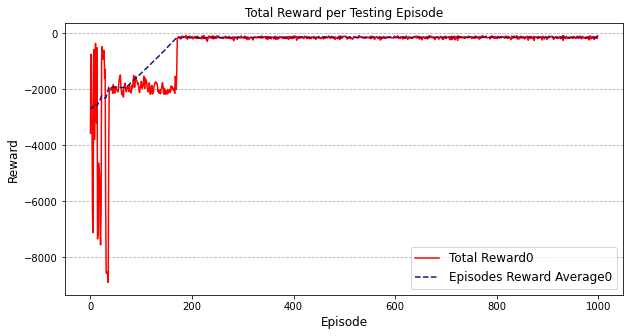

In [29]:
plt.figure(figsize=(10,5))
plt.plot(no_episodes,rewards_0, color = 'red',  linestyle = '-', 
        label = 'Total Reward0')

plt.plot(no_episodes, avg_rewards_0, color = 'midnightblue',  linestyle = '--', 
        label = 'Episodes Reward Average0')


plt.grid(b = True, which = 'major', axis = 'y', linestyle = '--')
plt.xlabel('Episode', fontsize = 12)
plt.ylabel('Reward',  fontsize = 12)
plt.title('Total Reward per Testing Episode',  fontsize = 12)  
plt.legend(loc = 'lower right', fontsize = 12)    
plt.show()

In [25]:
np.mean(rewards_0)+np.mean(rewards_1)+np.mean(rewards_2)

-8887.33046059408

In [26]:
np.mean(rewards_0+rewards_1+rewards_2)

-2962.4434868646927

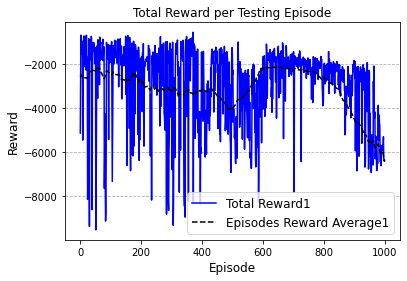

In [27]:
plt.plot(no_episodes,rewards_1, color = 'blue',  linestyle = '-', 
        label = 'Total Reward1')
plt.plot(no_episodes, avg_rewards_1, color = 'black',  linestyle = '--', 
        label = 'Episodes Reward Average1')

plt.grid(b = True, which = 'major', axis = 'y', linestyle = '--')
plt.xlabel('Episode', fontsize = 12)
plt.ylabel('Reward',  fontsize = 12)
plt.title('Total Reward per Testing Episode',  fontsize = 12)  
plt.legend(loc = 'lower right', fontsize = 12)    
plt.show()


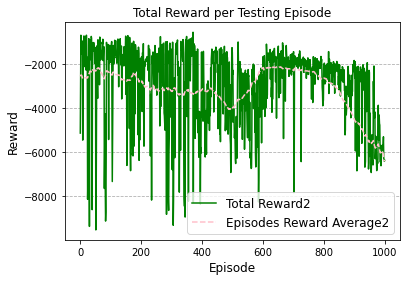

In [28]:
plt.plot(no_episodes,rewards_2, color = 'green',  linestyle = '-', 
        label = 'Total Reward2')
plt.plot(no_episodes, avg_rewards_2, color = 'pink',  linestyle = '--', 
        label = 'Episodes Reward Average2')

plt.grid(b = True, which = 'major', axis = 'y', linestyle = '--')
plt.xlabel('Episode', fontsize = 12)
plt.ylabel('Reward',  fontsize = 12)
plt.title('Total Reward per Testing Episode',  fontsize = 12)  
plt.legend(loc = 'lower right', fontsize = 12)    
plt.show()

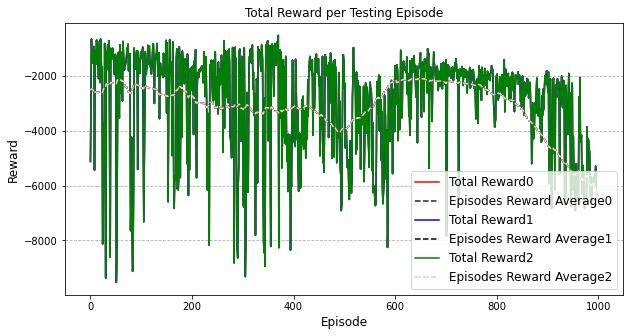

In [29]:
plt.figure(figsize=(10,5))
plt.plot(no_episodes,rewards_0, color = 'red',  linestyle = '-', 
        label = 'Total Reward0')

plt.plot(no_episodes, avg_rewards_0, color = 'midnightblue',  linestyle = '--', 
        label = 'Episodes Reward Average0')

plt.plot(no_episodes,rewards_1, color = 'blue',  linestyle = '-', 
        label = 'Total Reward1')
plt.plot(no_episodes, avg_rewards_1, color = 'black',  linestyle = '--', 
        label = 'Episodes Reward Average1')
plt.plot(no_episodes,rewards_2, color = 'green',  linestyle = '-', 
        label = 'Total Reward2')
plt.plot(no_episodes, avg_rewards_2, color = 'pink',  linestyle = '--', 
        label = 'Episodes Reward Average2')

plt.grid(b = True, which = 'major', axis = 'y', linestyle = '--')
plt.xlabel('Episode', fontsize = 12)
plt.ylabel('Reward',  fontsize = 12)
plt.title('Total Reward per Testing Episode',  fontsize = 12)  
plt.legend(loc = 'lower right', fontsize = 12)    
plt.show()

In [30]:
total_avg_reward=[]

In [31]:
for i in range(0,1000):
    k=np.mean(rewards_0[i]+rewards_1[i]+rewards_2[i])
    k=np.round(k,3)
    total_avg_reward.append(k)

In [32]:
avg_total=[]

In [33]:
for i in range(0,1000):
    k=np.mean(total_avg_reward[i:i+100])
    k=np.round(k,3)
    avg_total.append(k)

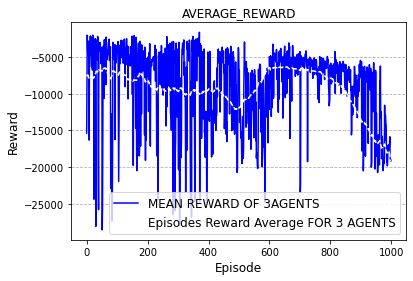

In [34]:
plt.plot(no_episodes,total_avg_reward, color = 'blue',  linestyle = '-', 
        label = 'MEAN REWARD OF 3AGENTS')
plt.plot(no_episodes, avg_total, color = 'white',  linestyle = '--', 
        label = 'Episodes Reward Average FOR 3 AGENTS')

plt.grid(b = True, which = 'major', axis = 'y', linestyle = '--')
plt.xlabel('Episode', fontsize = 12)
plt.ylabel('Reward',  fontsize = 12)
plt.title('AVERAGE_REWARD',fontsize = 12)  
plt.legend(loc = 'lower right', fontsize = 12)    
plt.show()

In [32]:
agent1.target_actor.save('target_actor_model_nan.h5')

In [33]:
agent1.target_critic.save('target_critic_model_nan.h5')

[<tf.Variable 'dense_6/kernel:0' shape=(21, 16) dtype=float32, numpy=
 array([[-5.09392142e-01,  3.68164897e-01, -3.83832306e-01,
         -9.02906477e-01, -8.71102452e-01, -9.32410061e-01,
         -6.97699562e-02, -1.79780889e+00, -3.88581567e-02,
          6.25839084e-02, -6.39559189e-03, -7.76263356e-01,
         -6.19652450e-01,  4.70268488e-01, -7.15224743e-01,
         -3.10086697e-01],
        [ 6.82862937e-01, -1.14630064e-04, -1.70903906e-01,
         -1.26941785e-01, -1.27869654e+00, -4.06113058e-01,
          2.57350177e-01, -2.36584079e-02,  1.93885922e-01,
         -1.15936112e+00,  2.42937997e-01, -1.42428017e+00,
         -1.18750162e-01, -1.00830650e+00,  9.20019746e-02,
          7.40710020e-01],
        [ 6.74674332e-01,  3.74028385e-01, -2.35173032e-01,
          1.87499393e-02, -3.99986058e-01, -6.18925869e-01,
         -1.74790487e-01, -8.29222202e-02, -1.48670375e-01,
         -1.78368613e-01,  4.87543404e-01, -5.83423115e-02,
          3.06232721e-01, -2.4169232